<a href="https://colab.research.google.com/github/dgmpurf/Face-Detective-and-blur/blob/main/Face%20Detect.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install facenet_pytorch
!pip install imutils
!pip install --upgrade imutils
!pip3 install mtcnn
!pip install utils
!pip install tensorflow_datasets
!git clone https://github.com/bubbliiiing/retinaface-tf2.git

     |████████████████████████████████| 1.9MB 17.3MB/s 
Requirement already up-to-date: imutils in /usr/local/lib/python3.7/dist-packages (0.5.4)
     |████████████████████████████████| 2.3MB 18.4MB/s 
Cloning into 'retinaface-tf2'...
remote: Enumerating objects: 119, done.
remote: Total 119 (delta 0), reused 0 (delta 0), pack-reused 119
Receiving objects: 100% (119/119), 5.92 MiB | 36.32 MiB/s, done.
Resolving deltas: 100% (53/53), done.


In [ ]:
import os
import sys
import cv2
import numpy as np


"""预处理
"""
IMAGE_SIZE = 64


def resize_image(image, height=IMAGE_SIZE, width=IMAGE_SIZE):
  """按照指定尺寸调整图像大小
  """
  top, bottom, left, right = (0, 0, 0, 0)
  h, w, _ = image.shape
  # 找到最长的边（对于长宽不等的图像）
  longest_edge = max(h, w)
  # 计算短边需要增加多上像素宽度使其与长边等长
  if h < longest_edge:
    dh = longest_edge - h
    top = dh // 2
    bottom = dh - top
  elif w < longest_edge:
    dw = longest_edge - w
    left = dw // 2
    right = dw - left
  else:
    pass

  # RGB色彩
  BLACK = [0, 0, 0]
  # 给图像增加边界，是图像长、宽等长，cv2.BORDED_CONSTANT指定边界颜色由value指定
  constant = cv2.copyMakeBorder(image, top, bottom, left, right, cv2.BORDER_CONSTANT, value=BLACK)
  return cv2.resize(constant, (height, width))


# 读取训练数据
images = []
labels = []

def read_path(path_name):
  for dir_item in os.listdir(path_name):
    # 从初始路径开始叠加，合并成可识别操作路径
    full_path = os.path.abspath(os.path.join(path_name, dir_item))
    if os.path.isdir(full_path):
      read_path(full_path)
    else:
      if dir_item.endswith('.jpg') or dir_item.endswith('.png'):
        image = cv2.imread(full_path)
        image = resize_image(image, IMAGE_SIZE, IMAGE_SIZE)
        # cv2.imwrite('1.jpg', image)
        images.append(image)
        labels.append(path_name)
  return images, labels


# 从指定路径读取训练数据
def load_dataset(path_name):
  images, labels = read_path(path_name)
  # 将图片转换成四维数组，尺寸：图片数量 * IMAGE_SIZE * IMAGE_SIZE * 3
  # 图片为 64*64 像素，一个像素3个颜色值
  images = np.array(images)
  print(images.shape)

  # 标注数据
  labels = np.array([0 if label.endswith('jiangwen') else 1 if label.endswith('zhangziyi') else 2 if label.endswith('pengyuyan') else 3 if label.endswith('liuqiangdong') else 4 for label in labels])
  return images, labels


if __name__ == '__main__':
  if len(sys.argv) != 1:
      print('Usage: %s path_name\r\n' % (sys.argv[0]))
  else:
      images, labels = load_dataset('./face')

Usage: /usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py path_name



In [ ]:
import random

from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Convolution2D
from keras.layers import MaxPooling2D
from keras.layers import Dropout
from keras.layers import Activation
from keras.layers import Flatten
from keras.layers import Dense
from keras.optimizers import SGD
from keras.utils import np_utils
from keras.models import load_model
from keras import backend
from tensorflow import keras
import tensorflow as tf

from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


In [ ]:
class Dataset:
  def __init__(self, path_name):
    # 训练集
    self.train_images = None
    self.train_labels = None
    # 验证集
    self.valid_images = None
    self.valid_labels = None
    # 测试集
    self.test_images = None
    self.test_labels = None
    # 数据集加载路径
    self.path_name = path_name
    # 当前库采取的维度顺序
    self.input_shape = None

  # 加载数据集并按照交叉验证划分数据集再开始相关的预处理
  def load(self, img_rows=IMAGE_SIZE, img_cols=IMAGE_SIZE, img_channels=3, nb_classes=5):
    images, labels = load_dataset(self.path_name)
    train_images, valid_images, train_labels, valid_lables = train_test_split(images,
                                                                              labels,
                                                                              test_size=0.2,
                                                                              random_state=random.randint(0, 100))
    _, test_images, _, test_labels = train_test_split(images,
                                                      labels,
                                                      test_size=0.3,
                                                      random_state=random.randint(0, 100))
    # 当前维度顺序如果是'th'，则输入图片数据时的顺序为：channels, rows, cols; 否则：rows, cols, channels
    # 根据keras库要求的维度重组训练数据集
    if backend.image_data_format() == 'channels_first':
      train_images = train_images.reshape(train_images.shape[0], img_channels, img_rows, img_cols)
      valid_images = valid_images.reshape(valid_images.shape[0], img_channels, img_rows, img_cols)
      test_images = test_images.reshape(test_images.shape[0], img_channels, img_rows, img_cols)
      self.input_shape = (img_channels, img_rows, img_cols)
    else:
      train_images = train_images.reshape(train_images.shape[0], img_rows, img_cols, img_channels)
      valid_images = valid_images.reshape(valid_images.shape[0], img_rows, img_cols, img_channels)
      test_images = test_images.reshape(test_images.shape[0], img_rows, img_cols, img_channels)
      self.input_shape = (img_rows, img_cols, img_channels)

    # 输出训练集、验证集、测试集数量
    print(train_images.shape[0], 'train samples')
    print(valid_images.shape[0], 'valid samples')
    print(test_images.shape[0], 'test samples')

    # 使用categorical_crossentropy作为损失，因此需要根据类别数量nb_classes将类别标签进行one-hot编码，分类类别为4类，所以转换后的标签维数为4
    train_labels = np_utils.to_categorical(train_labels, nb_classes)
    valid_lables = np_utils.to_categorical(valid_lables, nb_classes)
    test_labels = np_utils.to_categorical(test_labels, nb_classes)

    # 像素数据浮点化以便进行归一化
    train_images = train_images.astype('float32')
    valid_images = valid_images.astype('float32')
    test_images = test_images.astype('float32')

    # 归一化
    train_images /= 255
    valid_images /= 255
    test_images /= 255

    train_labels = np.argmax(train_labels, axis=1)
    test_labels = np.argmax(test_labels, axis=1)
    valid_lables = np.argmax(valid_lables, axis=1)

    self.train_images = train_images
    self.valid_images = valid_images
    self.test_images = test_images
    self.train_labels = train_labels
    self.valid_labels = valid_lables
    self.test_labels = test_labels


In [ ]:
"""CNN构建
"""


class CNNModel:
  def __init__(self):
    self.model = None

  # 模型构建
  def build_model(self, dataset, nb_classes=2):
    # 构建一个空间网络模型（一个线性堆叠模型）
    self.model = keras.Sequential([
    keras.layers.Conv2D(filters=32, kernel_size=(3,3),input_shape=dataset.input_shape, activation=tf.nn.relu),
    keras.layers.MaxPooling2D(pool_size=(2,2)),
    keras.layers.Conv2D(filters=32, kernel_size=(3,3),input_shape=dataset.input_shape, activation=tf.nn.relu),
    keras.layers.MaxPooling2D(pool_size=(2,2)),
    keras.layers.Flatten(),
    keras.layers.Dense(units=32, activation=tf.nn.relu),
    keras.layers.Dense(units=32, activation=tf.nn.relu),
    keras.layers.Dense(units=10, activation=tf.nn.softmax)
    ])

  def train(self, dataset, batch_size=10, nb_epoch=5, data_augmentation=True):
    sgd = SGD(lr=0.001, decay=1e-6, momentum=0.7, nesterov=True)  # SGD+momentum的训练器
    self.model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])  # 模型配置工作
    # 跳过数据提升
    if not data_augmentation:
        self.model.fit(dataset.train_images,
                        dataset.train_labels,
                        batch_size=batch_size,
                        nb_epoch=nb_epoch,
                        validation_data=(dataset.valid_images, dataset.valid_labels),
                        shuffle=True)
      # 使用实时数据提升
    else:
      # 定义数据生成器用于数据提升，其返回一个生成器对象datagen，datagen每被调用一次
      # 其顺序生成一组数据，节省内存，该数据生成器其实就是python所定义的数据生成器
      datagen = ImageDataGenerator(featurewise_center=False,              # 是否使输入数据去中心化（均值为0）
                                    samplewise_center=False,               # 是否使输入数据的每个样本均值为0
                                    featurewise_std_normalization=False,   # 是否数据标准化（输入数据除以数据集的标准差）
                                    samplewise_std_normalization=False,    # 是否将每个样本数据除以自身的标准差
                                    zca_whitening=False,                   # 是否对输入数据施以ZCA白化
                                    rotation_range=20,                     # 数据提升时图片随机转动的角度(范围为0～180)
                                    width_shift_range=0.2,                 # 数据提升时图片水平偏移的幅度（单位为图片宽度的占比，0~1之间的浮点数）
                                    height_shift_range=0.2,                # 垂直偏移幅度
                                    horizontal_flip=True,                  # 是否进行随机水平翻转
                                    vertical_flip=False                    # 是否进行随机垂直翻转
                                    )
      datagen.fit(dataset.train_images)
      self.model.fit(datagen.flow(dataset.train_images,
                                            dataset.train_labels,
                                            batch_size=batch_size),
                                steps_per_epoch=(dataset.train_images.shape[0] / batch_size),
                                epochs=nb_epoch,
                                validation_data=(dataset.valid_images, dataset.valid_labels)
                                )

  MODEL_PATH = "cascadeface.model.h5"

  def save_model(self, file_path=MODEL_PATH):
    self.model.save(file_path)

  def load_model(self, file_path=MODEL_PATH):
    self.model = load_model(file_path)

  def evaluate(self, dataset):
    score = self.model.evaluate(dataset.test_images, dataset.test_labels, verbose=1)
    self.model.summary()
    print('%s: %.2f%%' % (self.model.metrics_names[1], score[1] * 100))

  # 识别人脸
  def face_predict(self, image):
    # 根据后端系统确定维度顺序
    if backend.image_data_format() == 'channels_first' and image.shape != (1, 3, IMAGE_SIZE, IMAGE_SIZE):
        image = resize_image(image)  # 尺寸必须与训练集一致，都为：IMAGE_SIZE * IMAGE_SIZE
        image = image.reshape((1, 3, IMAGE_SIZE, IMAGE_SIZE))  # 与模型训练不同，这里是预测单张图像
    elif backend.image_data_format() == 'channels_last' and image.shape != (1, IMAGE_SIZE, IMAGE_SIZE, 3):
        image = resize_image(image)
        image = image.reshape((1, IMAGE_SIZE, IMAGE_SIZE, 3))

    # 归一化
    image = image.astype('float32')
    image /= 255
    # 给出输入属于各类别的概率
    result = self.model.predict_proba(image)
    print('result:', result)
    result = self.model.predict_classes(image)
    # 返回预测结果
    return result[0]

  def eval_model(self, epochs=5):
    self.model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    print ('num', len(dataset.train_labels))
    hist = self.model.fit(dataset.train_images, dataset.train_labels, epochs=epochs)
    #train_acc = hist.history['acc'][-1]
    test_loss, test_acc = self.model.evaluate(dataset.test_images, dataset.test_labels)
    self.model.summary()
    print('Epochs: ' + str(epochs))
    print(hist)

In [ ]:
if __name__ == '__main__':
  dataset = Dataset('/content/gdrive/My Drive/face')
  dataset.load()
  model = CNNModel()
  model.build_model(dataset)
  model.train(dataset)
  model.evaluate(dataset)
  # model.eval_model()
  model.save_model()
  #image = cv2.imread('/content/gdrive/My Drive/CPTS437/face/jiangwen/0b1937e2-f929-11e8-8a8a-005056c00008.jpg')
  #newimage = np.array(image) 
  #model.face_predict(newimage)

(352, 64, 64, 3)
281 train samples
71 valid samples
106 test samples
Epoch 1/5
28/28 [==============================] - 3s 78ms/step - loss: 1.9228 - accuracy: 0.3186 - val_loss: 1.7353 - val_accuracy: 0.2676
Epoch 2/5
28/28 [==============================] - 2s 62ms/step - loss: 1.2308 - accuracy: 0.4724 - val_loss: 0.8716 - val_accuracy: 0.5915
Epoch 3/5
28/28 [==============================] - 2s 63ms/step - loss: 0.9744 - accuracy: 0.5369 - val_loss: 0.8408 - val_accuracy: 0.7324
Epoch 4/5
28/28 [==============================] - 2s 63ms/step - loss: 0.7730 - accuracy: 0.6408 - val_loss: 0.9627 - val_accuracy: 0.4507
Epoch 5/5
4/4 [==============================] - 0s 30ms/step - loss: 0.5689 - accuracy: 0.7075
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 62, 62, 32)        896       
_________________________________________________________

In [ ]:
# import the necessary packages
from collections import namedtuple
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image
# define the `Detection` object
Detection = namedtuple("Detection", ["savedTempImage", "gt", "pred"])

In [ ]:
def bb_intersection_over_union(boxA, boxB):
	# determine the (x, y)-coordinates of the intersection rectangle
	xA = max(boxA[0], boxB[0])
	yA = max(boxA[1], boxB[1])
	xB = min(boxA[2], boxB[2])
	yB = min(boxA[3], boxB[3])
	# compute the area of intersection rectangle
	interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
	# compute the area of both the prediction and ground-truth
	# rectangles
	boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
	boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
	# compute the intersection over union by taking the intersection
	# area and dividing it by the sum of prediction + ground-truth
	# areas - the interesection area
	iou = interArea / float(boxAArea + boxBArea - interArea)
	# return the intersection over union value
	return iou

In [ ]:
# import the necessary packages
import torch 
import torchvision
import torchvision.transforms as transforms
import os
import torch.nn as nn
import torch.nn.functional as F
import torchvision.datasets as dset
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torchvision.utils import save_image
from torchvision.utils import make_grid
from torch.autograd import Variable
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from google.colab import drive
from __future__ import print_function
from imutils.object_detection import non_max_suppression
from imutils import paths
import numpy as np
import argparse
import imutils
import cv2
from os import listdir
from PIL import Image
from matplotlib import pyplot
# from mtcnn.mtcnn import MTCNN
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from PIL import Image
from facenet_pytorch import MTCNN
import utils
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


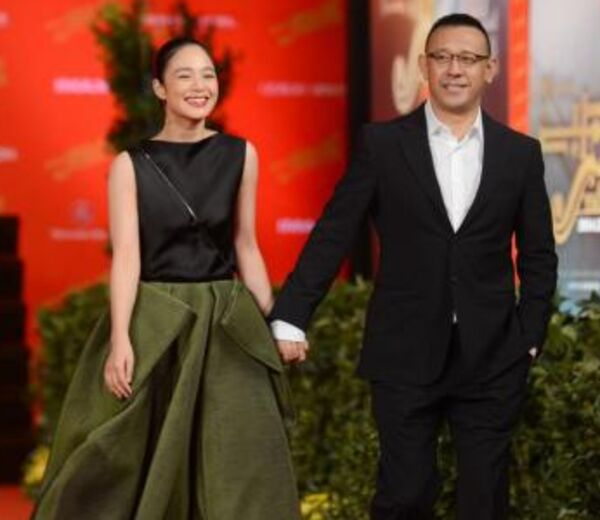

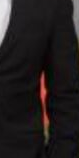

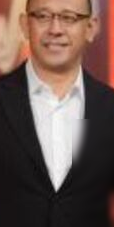

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


result: [[0.5692404  0.08145082 0.1655019  0.07057139 0.00976484 0.00876965
  0.01428132 0.00431296 0.02979976 0.04630697]]


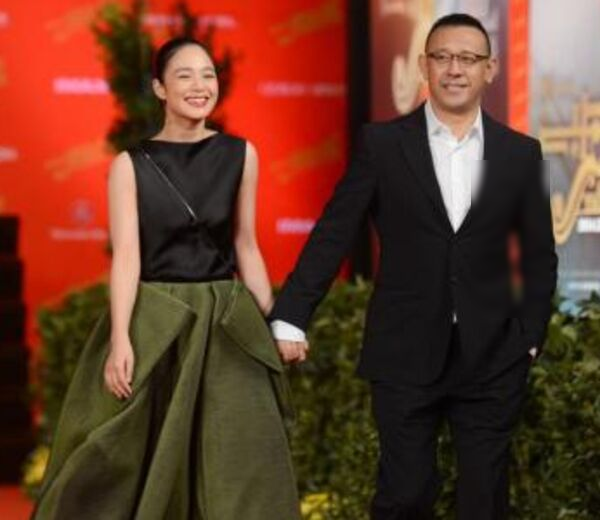

[INFO] p1610297363_66549.jpg: 2 original boxes, 2 after suppression


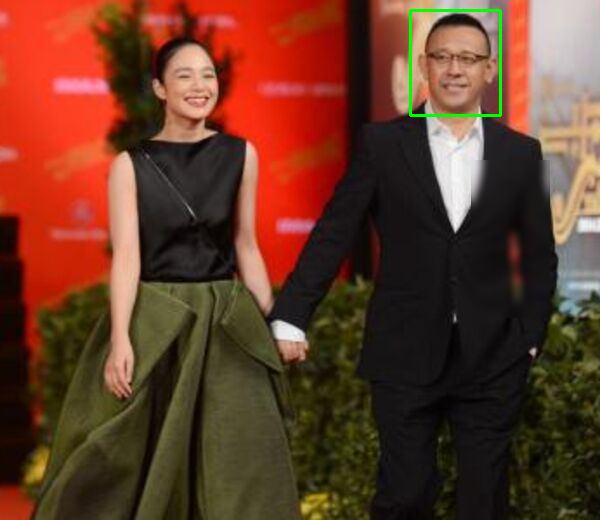

/content/gdrive/My Drive/otherface/p1610297363_66549.jpg: 0.0000
0.0


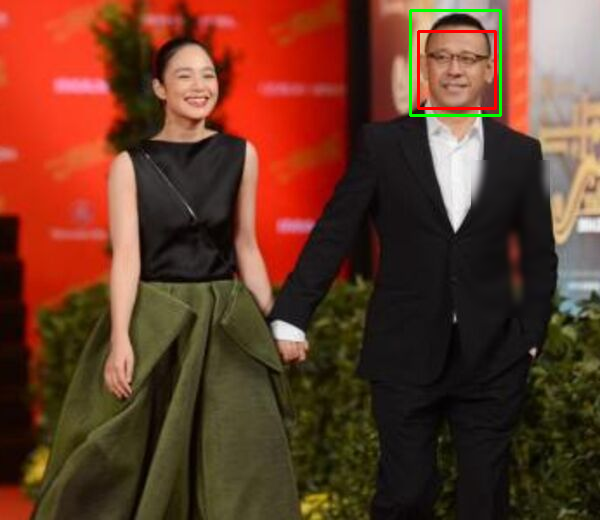

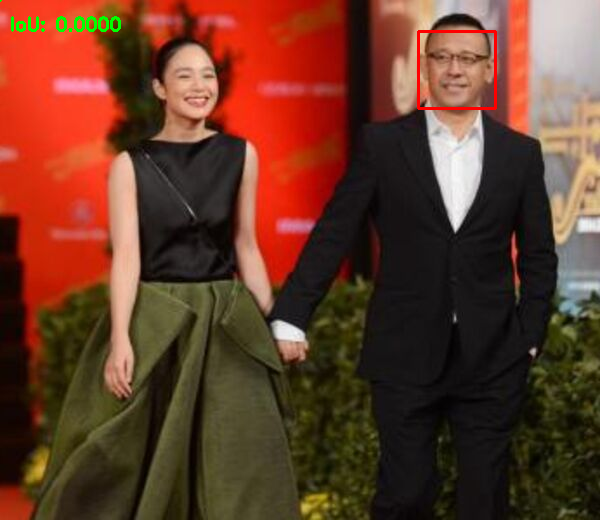

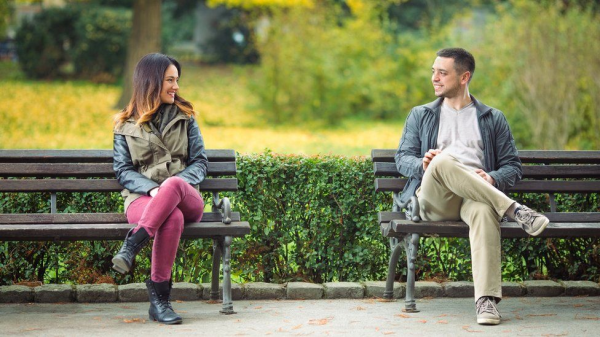

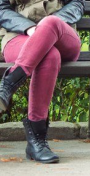

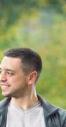

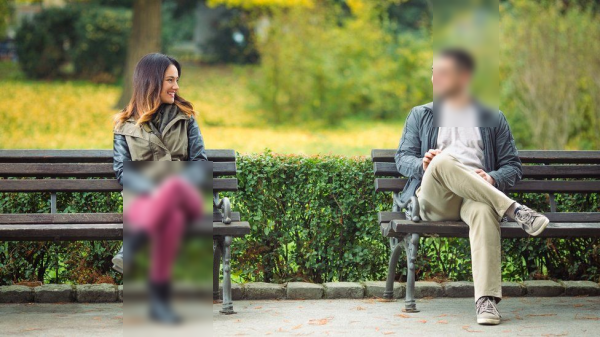

[INFO] image2.jpg: 2 original boxes, 2 after suppression


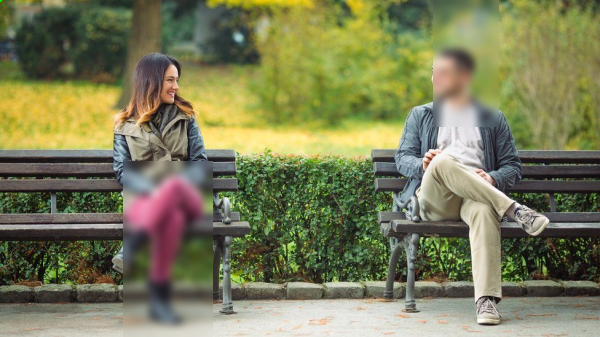

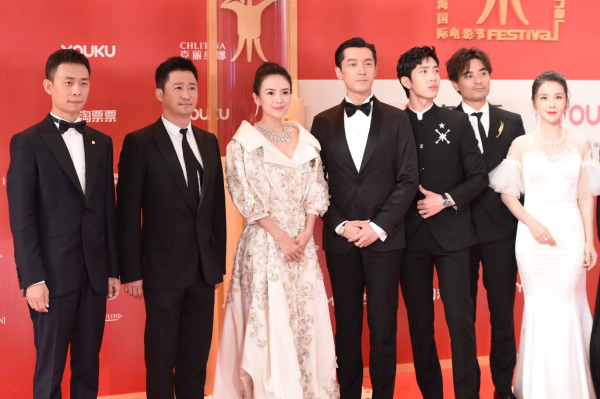

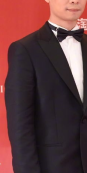

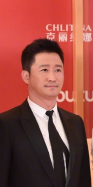

result: [[1.7933939e-03 9.5022339e-01 4.5451771e-02 2.5190685e-03 4.4216922e-11
  8.0040891e-10 1.4064712e-10 2.7598219e-09 7.0493584e-06 5.3717754e-06]]


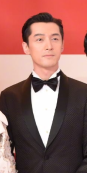

result: [[3.9946844e-04 9.7495711e-01 2.1447338e-02 3.1922979e-03 6.7888733e-12
  2.9200115e-10 1.1844557e-11 7.2875045e-10 2.2325928e-06 1.4542410e-06]]


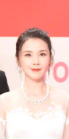

result: [[1.4024187e-04 9.6526015e-01 1.5631944e-02 1.8962009e-02 5.3154876e-11
  2.7869829e-09 1.6595414e-11 3.4516014e-09 3.5149769e-06 2.0876118e-06]]


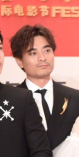

result: [[5.4138462e-04 9.4890183e-01 4.5652330e-02 4.8831538e-03 1.3458024e-10
  5.7822267e-09 2.3306443e-10 1.0874025e-08 1.1793847e-05 9.4958559e-06]]


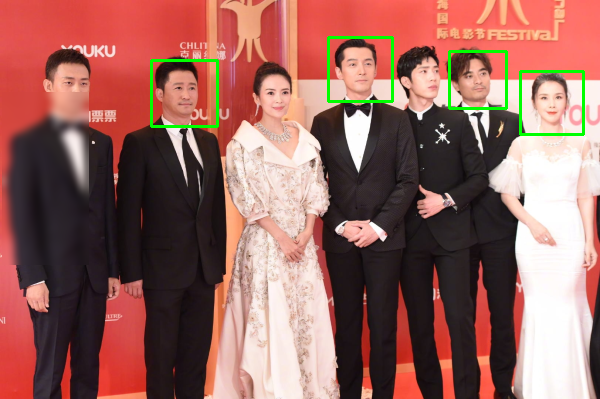

[INFO] 39343ff6b8094dc7b9830e80692ac80b.png: 5 original boxes, 5 after suppression


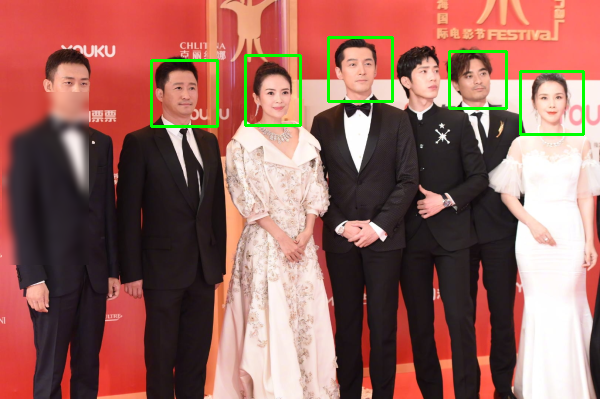

/content/gdrive/My Drive/otherface/39343ff6b8094dc7b9830e80692ac80b.png: 0.0000
0.0


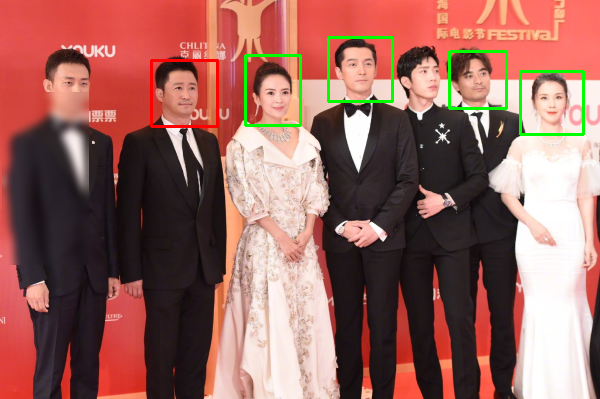

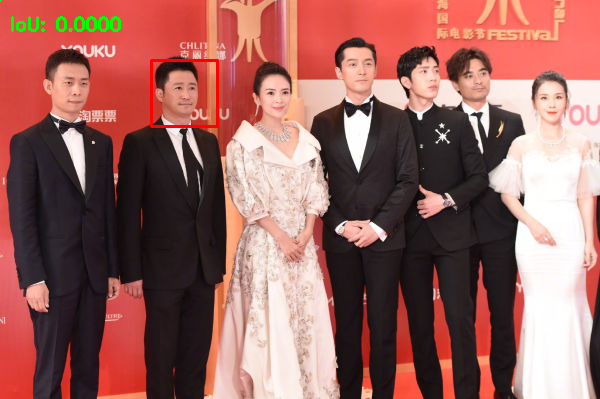

/content/gdrive/My Drive/otherface/39343ff6b8094dc7b9830e80692ac80b.png: 0.0000
0.0


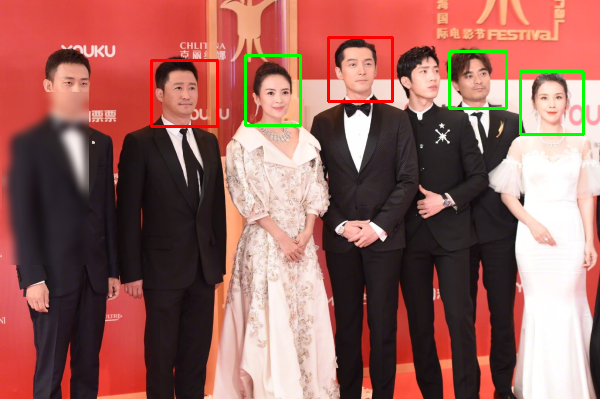

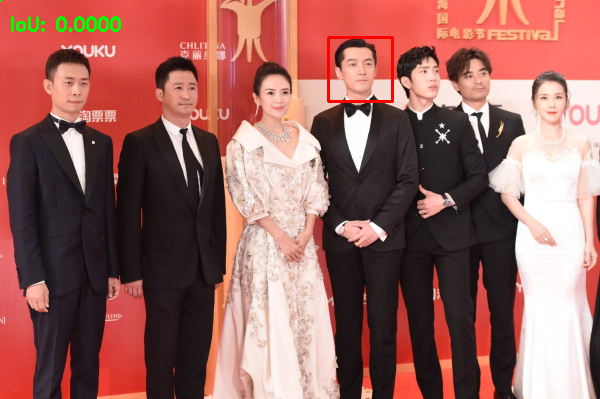

/content/gdrive/My Drive/otherface/39343ff6b8094dc7b9830e80692ac80b.png: 0.0000
0.0


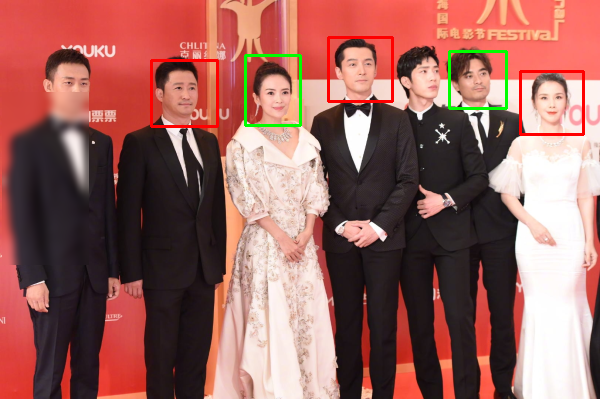

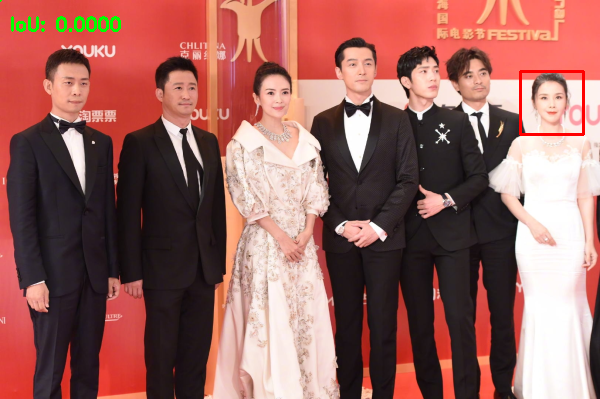

/content/gdrive/My Drive/otherface/39343ff6b8094dc7b9830e80692ac80b.png: 0.0000
0.0


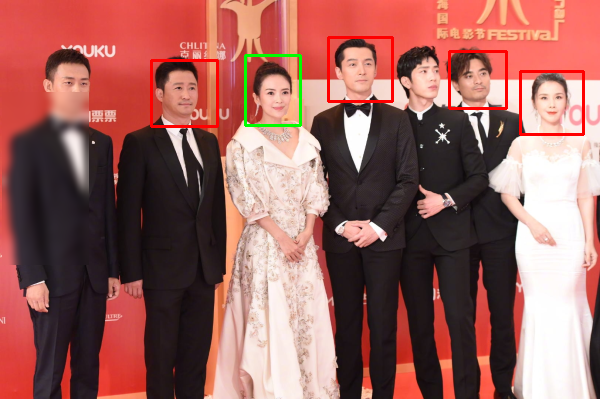

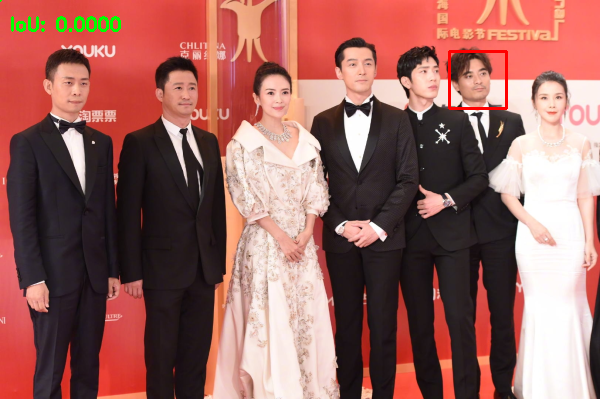

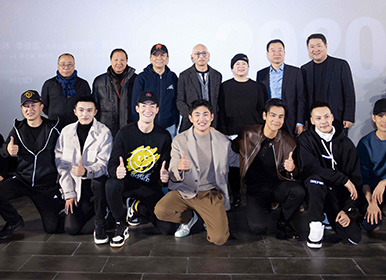

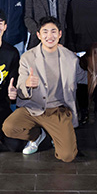

result: [[1.1832303e-03 7.7013218e-01 1.4490178e-01 8.3192103e-02 4.4485748e-07
  2.6174828e-05 1.3310337e-07 4.6556970e-06 2.6850199e-04 2.9070801e-04]]


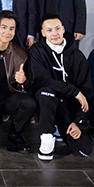

result: [[2.4853729e-01 3.9795557e-01 3.3468902e-01 1.5174177e-02 1.1219885e-05
  4.6711997e-05 4.1473235e-05 2.2007896e-05 1.1032315e-03 2.4193779e-03]]


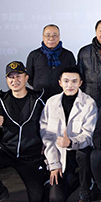

result: [[8.0986228e-03 6.4956087e-01 4.8713949e-02 2.9349583e-01 4.1820772e-07
  4.0293298e-06 4.0907334e-08 1.0772371e-06 8.0502716e-05 4.4677177e-05]]


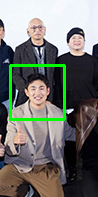

result: [[7.4163824e-04 7.9228580e-01 1.7041656e-01 3.6126632e-02 1.6480831e-07
  2.0446631e-05 8.1451304e-08 2.7431379e-06 1.5120425e-04 2.5477458e-04]]
result: [[0.5692404  0.08145082 0.1655019  0.07057139 0.00976484 0.00876965
  0.01428132 0.00431296 0.02979976 0.04630697]]


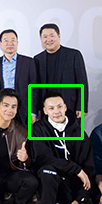

result: [[1.06363796e-01 4.13721532e-01 4.70850646e-01 6.47313148e-03
  2.84381463e-06 4.21392469e-05 1.72552973e-05 9.30625265e-06
  5.53020334e-04 1.96644710e-03]]


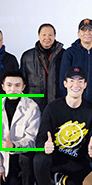

result: [[1.1275518e-02 7.1854836e-01 6.7653753e-02 2.0229758e-01 6.2681443e-07
  7.0986375e-06 9.8103300e-08 1.8569116e-06 1.2082856e-04 9.4294519e-05]]


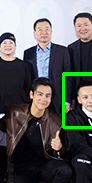

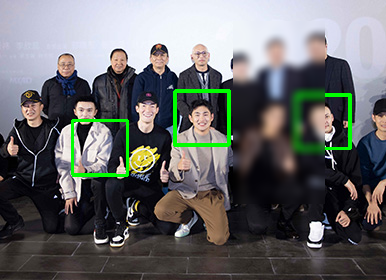

[INFO] 201217204727158_894.png: 7 original boxes, 7 after suppression


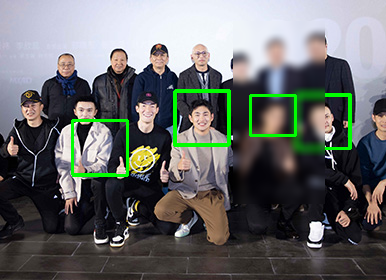

/content/gdrive/My Drive/otherface/201217204727158_894.png: 0.0000
0.0


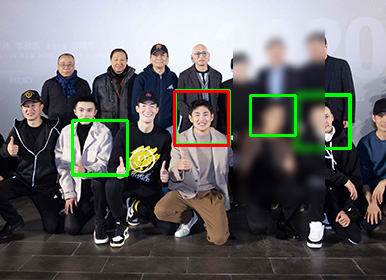

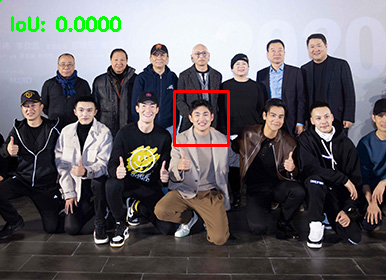

/content/gdrive/My Drive/otherface/201217204727158_894.png: 0.0000
0.0


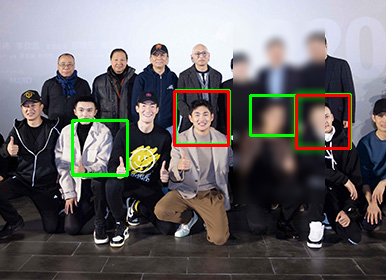

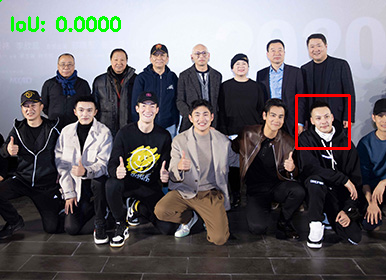

/content/gdrive/My Drive/otherface/201217204727158_894.png: 0.0000
0.0


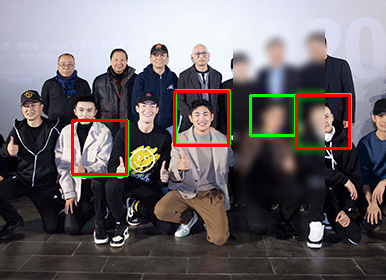

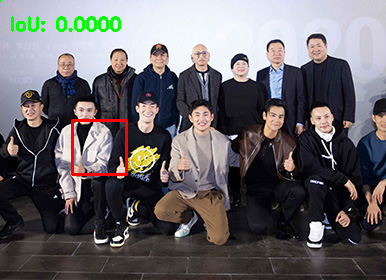

/content/gdrive/My Drive/otherface/201217204727158_894.png: 0.0000
0.0


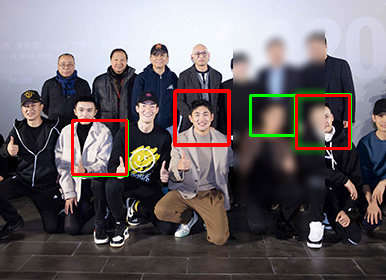

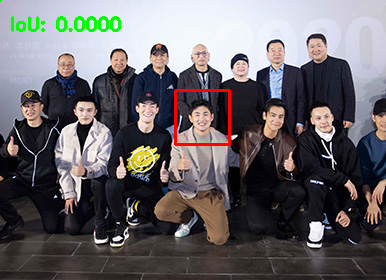

/content/gdrive/My Drive/otherface/201217204727158_894.png: 0.0000
0.0


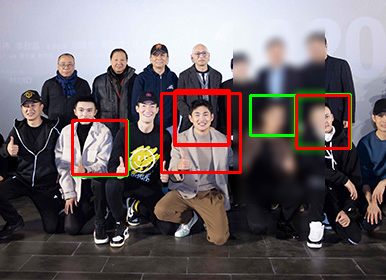

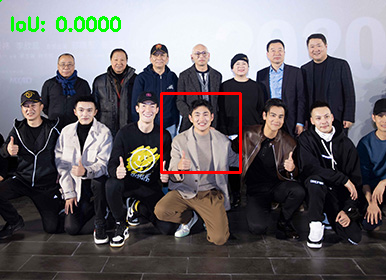

/content/gdrive/My Drive/otherface/201217204727158_894.png: 0.0000
0.0


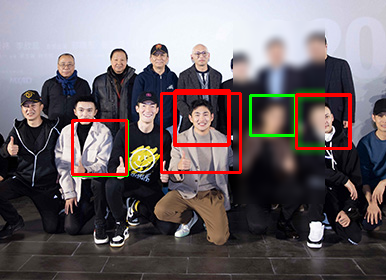

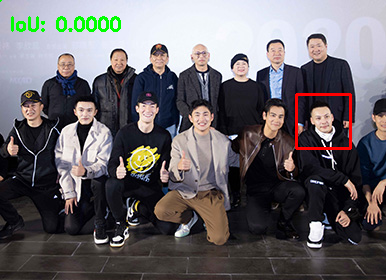

/content/gdrive/My Drive/otherface/201217204727158_894.png: 0.0000
0.0


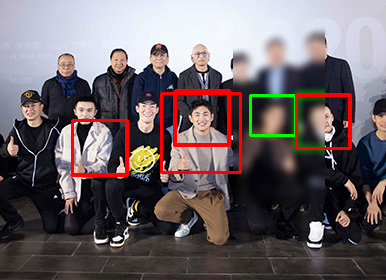

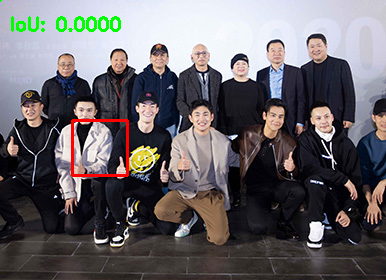

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

def run_model(image, IoUList):
  savedTempImage = image
  
   # detect people in the image using hog
  (rects, weights) = hog.detectMultiScale(image, winStride=(4, 4),
    padding=(4, 4), scale=1.01)
  
  # draw the original bounding boxes
  for (x, y, w, h) in rects:
    cv2.rectangle(orig, (x, y), (x + w, y + h), (0, 0, 255), 2)

  # apply non-maxima suppression to the bounding boxes using a
  # fairly large overlap threshold to try to maintain overlapping
  # boxes that are still people
  rects = np.array([[x, y, x + w, y + h] for (x, y, w, h) in rects])
  pick = non_max_suppression(rects, probs=None, overlapThresh=0.65)

  recent = []
  for (xA, yA, xB, yB) in pick:
    # crop out person
    tempPerson = image[yA:yB, xA:xB]
    tempPerson_gray = cv2.cvtColor(tempPerson, cv2.COLOR_BGR2GRAY)
    cv2_imshow(tempPerson)
    faceRects = cascade.detectMultiScale(tempPerson_gray, scaleFactor=1.01, minNeighbors=3, minSize=(32, 32))

    # if there is face detected
    if len(faceRects) > 0:
      
      for faceRect in faceRects:
        x, y, w, h = faceRect

        # 截取图像脸部提交给识别模型识别
        img = tempPerson[y-10: y + h + 10, x-10: x + w + 10]
        faceID = model.face_predict(img)
        
        if faceID == 0:
          recent.append([x, y, w, h, xA, yA, xB, yB])
        elif faceID == 1:
          recent.append([x, y, w, h, xA, yA, xB, yB])
          cv2.rectangle(tempPerson, (x - 10, y - 10), (x + w + 10, y + h + 10), color, thickness=2)
        elif faceID == 2:
          recent.append([x, y, w, h, xA, yA, xB, yB])
          cv2.rectangle(tempPerson, (x - 10, y - 10), (x + w + 10, y + h + 10), color, thickness=2)
        elif faceID == 3:
          recent.append([x, y, w, h, xA, yA, xB, yB])
          cv2.rectangle(tempPerson, (x - 10, y - 10), (x + w + 10, y + h + 10), color, thickness=2)
        else:
          # unknown face
          curFace = tempPerson[int(y):int(h), int(x):int(w)]
          curFace = cv2.GaussianBlur(curFace, (15,15),cv2.BORDER_DEFAULT)
          tempPerson[int(y):int(h), int(x):int(w)] = curFace
    else:
      # no face detected
      tempPerson = cv2.GaussianBlur(tempPerson, (15,15),cv2.BORDER_DEFAULT)
    image[yA:yB, xA:xB] = tempPerson
  cv2_imshow(image)

  # show some information on the number of bounding boxes
  filename = imagePath[imagePath.rfind("/") + 1:]
  print("[INFO] {}: {} original boxes, {} after suppression".format(
    filename, len(rects), len(pick)))
  
  savedTempImage = imutils.resize(savedTempImage, width=min(600, image.shape[1]))

  if len(IoUList) > 0:
    for (xA, yA, xB, yB) in IoUList:
      cv2.rectangle(savedTempImage, (xA, yA), (xB, yB), color, thickness=2)
    cv2_imshow(savedTempImage)
    
  for (x, y, w, h, xA, yA, xB, yB) in recent:
    cv2.rectangle(savedTempImage, (x + xA -10, y + yA -10), (xA + x + w + 10, y + yA + h + 10), (0,0,255), thickness=2)
    # define the list of example detections
    # In our case, Green is GT, and red box PB
    examples = [Detection(imagePath, [0, 0, 0, 0], [x + xA -10, y + yA -10, xA + x + w + 10, y + yA + h + 10])]
    # loop over the example detections
    for detection in examples:
      # load the image
      image = cv2.imread(detection.savedTempImage)
      image = imutils.resize(image, width=min(600, image.shape[1]))
      # draw the ground-truth bounding box along with the predicted
      # bounding box
      cv2.rectangle(image, tuple(detection.gt[:2]),
        tuple(detection.gt[2:]), (0, 255, 0), 2)
      cv2.rectangle(image, tuple(detection.pred[:2]),
        tuple(detection.pred[2:]), (0, 0, 255), 2)
      # compute the intersection over union and display it
      iou = bb_intersection_over_union(detection.gt, detection.pred)
      cv2.putText(image, "IoU: {:.4f}".format(iou), (10, 30),
        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
      print("{}: {:.4f}".format(detection.savedTempImage, iou))
      # show the output image
      print(iou)
      cv2_imshow(savedTempImage)
      cv2_imshow(image)

if __name__ == '__main__':

  # 加载模型
  model = CNNModel()
  model.load_model(file_path="cascadeface.model.h5")
  # 人脸识别矩形框
  color = (0, 255, 0)
  # 人脸识别分类器路径
  cascade_path = cv2.data.haarcascades + './haarcascade_frontalface_default.xml'

  # 读入分类器
  cascade = cv2.CascadeClassifier(cascade_path)

  # construct the argument parse and parse the arguments
  # initialize the HOG descriptor/person detector
  # Device configuration
  device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
  hog = cv2.HOGDescriptor()
  hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())


  p1IoU = [[410, 10, 500, 115]]
  imagePath = '/content/gdrive/My Drive/otherface/p1610297363_66549.jpg'
  image = cv2.imread(imagePath, cv2.IMREAD_COLOR)
  image = imutils.resize(image, width=min(600, image.shape[1]))
  cv2_imshow(image)
  orig = image.copy()
  run_model(image, p1IoU)

  p2IoU = [[0,0,0,0]]
  imagePath = '/content/gdrive/My Drive/otherface/image2.jpg'
  image = cv2.imread(imagePath, cv2.IMREAD_COLOR)
  image = imutils.resize(image, width=min(600, image.shape[1]))
  cv2_imshow(image)
  orig = image.copy()
  run_model(image, p2IoU)

  p3IoU = [[245, 55, 300, 125]]
  imagePath = '/content/gdrive/My Drive/otherface/39343ff6b8094dc7b9830e80692ac80b.png'
  image = cv2.imread(imagePath, cv2.IMREAD_COLOR)
  image = imutils.resize(image, width=min(600, image.shape[1]))
  cv2_imshow(image)
  orig = image.copy()
  run_model(image, p3IoU)

  p5IoU = [[250, 95, 295, 135]]
  imagePath = '/content/gdrive/My Drive/otherface/201217204727158_894.png'
  image = cv2.imread(imagePath, cv2.IMREAD_COLOR)
  image = imutils.resize(image, width=min(600, image.shape[1]))
  cv2_imshow(image)
  orig = image.copy()
  run_model(image, p5IoU)